# Ice cream reviews: clustering & topic modeling
Our goal is to extract insights from the reviews by clustering them (so that we don't have to read them all). We'll only look at reviews with less than 5 stars. While there could be important insights from 5 star reviews, these reviews are generally shorter and noisier (contain less feedback). 

In [218]:
import numpy as np
import pandas as pd
import re
from collections import Counter
from gsdmm import MovieGroupProcess # topic modeling for short texts

# NLTK
from nltk.corpus import stopwords, wordnet
from nltk.tokenize import RegexpTokenizer
from nltk import WordNetLemmatizer, pos_tag
from nltk import ngrams

# sklearn
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

# visualization
import matplotlib.pyplot as plt
import plotly.express as px

In [219]:
# load the reviews data
rev = pd.read_csv("ice-cream-dataset-v2/combined/reviews.csv", encoding="UTF-8")

# take a subset (1 brand at a time & only reviews with < 5 stars)
brand = "hd"
rev = rev.loc[(rev["brand"] == brand)&(rev["stars"] < 5)] 

rev.shape

(6286, 13)

# Preprocessing

## Building task-specific stopwords via product details
We would hope the reviews would not be clustered only by the product name (i.e. Chocolate Chip Cookie Dough Ice Cream and Vanilla Chocolate Chip Ice Cream) and instead be clustered based on consumer reception (i.e. reviews that disliked the texture should be grouped together). However, as we'll soon see, this is hard to avoid.

One step we take to try to prevent this is by looking at the product information. The `products.csv` file contains the product name, description, and ingredients. We concatenate all this data into one single string and then identify "very common" words which we'll add to our stopwords list.

In [76]:
# read in the product data
prod = pd.read_csv("ice-cream-dataset-v2/combined/products.csv", encoding="UTF-8")

# fill NA values with empty string
prod["description"] = prod["description"].fillna("")

# function to concatenate columns into a single string
def list_map(df, columns):
    return pd.Series(
        map(
            ' '.join,
            df[columns].values.tolist()
        ),
        index=df.index
    )

# concatenate, remove numbers and convert to lowercase
prod_details = list_map(prod, ["name", "description", "ingredients"])
prod_details = prod_details.apply(lambda x: re.sub(r"\d", '', x.lower()))

In [77]:
prod_details.shape

(241,)

In [78]:
prod_details[0]

'salted caramel core find your way to the ultimate ice cream experience with our cores. whether your primal urges lead you to the center of salted caramel or directly to the blonde brownies, you’ll be in total control of your own ice cream destiny. cream, skim milk, liquid sugar (sugar, water), water, brown sugar, sugar, milk, wheat flour, egg yolks, corn syrup, eggs, butter (cream, salt), butteroil, pectin, sea salt, soybean oil, vanilla extract, guar gum, soy lecithin, baking powder (sodium acid pyrophosphate, sodium bicarbonate, corn starch, monocalcium phosphate), baking soda, salt, carrageenan, lactase'

In [79]:
tokenizer = RegexpTokenizer(r'\w+')
ct = Counter(tokenizer.tokenize(" ".join(prod_details)))
print( ct.most_common(30) ) # common words in the product details

[('cream', 711), ('and', 705), ('sugar', 607), ('milk', 546), ('with', 504), ('a', 446), ('chocolate', 412), ('vanilla', 397), ('the', 380), ('oil', 371), ('of', 360), ('salt', 290), ('cocoa', 286), ('our', 274), ('breyers', 253), ('ice', 251), ('to', 250), ('flavor', 239), ('butter', 238), ('natural', 236), ('we', 227), ('corn', 213), ('s', 212), ('syrup', 205), ('that', 205), ('in', 203), ('lecithin', 199), ('you', 195), ('water', 195), ('coconut', 190)]


In [80]:
# stopwords from NLTK
nltk_sw = stopwords.words('english') 

# stopwords from https://www.kaggle.com/rtatman/stopword-lists-for-19-languages
with open("englishST.txt") as f:
    kaggle_sw = f.read().split() 
    
# task-specific stopwords, i.e. "chocolate", "vanilla", product names, brand names & misspellings, etc.
th = 100 # words that occur >= th times in the product details will be put in stopwords
icecream_sw = [word for word,count in ct.most_common() if count >= th]
icecream_sw += ["ben", "jerry", "jerrys", "bj", "benjerrys", "haagen", "dazs", "daz", 
               "haagendazs", "haagendaz", "haagen", "hagen", "hagendazs", "häagen", "häagendazs","Häagendaz", 
                "breyers", "breyer", "talenti", 
                "talentis", "unilever", "unilevercom", "mills", "froneri", "ice", "cream", "icecream", "icecreams", "gelato", 
                "brand", "nestle", "nestl", "dryers", "review", "collected", "part", "promotion"]

print("NLTK stopwords: %i, Kaggle stopwords: %i, Ice cream stopwords: %i" % (len(nltk_sw), len(kaggle_sw), len(icecream_sw)))

# combine them
sw = set(nltk_sw + kaggle_sw + icecream_sw)

# a few stopwords that shouldn't be in here - "natural flavor" appears a lot in ingredients, but both words could be important
sw = sw - set(["natural", "flavor", "creamy", "value", "down", "downward"])

print("Final stopwords:", len(sw))

NLTK stopwords: 179, Kaggle stopwords: 571, Ice cream stopwords: 88
Final stopwords: 662


## Text preprocessing (including lemmatization)
Now we can preprocess our review text. Our process is documented in the `preprocess_docs` function. 

A major part of our preprocessing pipeline is our choice of text normalization technique. Generally, performing text normalization (stemming or lemmatization) leads to an increase model performance in NLP tasks. Which to perform seems to depend on the task. Advantages of stemming are that it is computationally faster and does not rely on having a good POS tagger. On the other hand, an advantage of lemmatization is that it produces actual words, which gives better interpretability.

Since we care about interpreting our topics: we choose to use lemmatization

In [220]:
def get_wordnet_pos(word_list):
    """ Get POS tags for a list of tokens using nltk.pos_tag and then converting to wordnet POS format.
        Note: word_list should represent a single sentence, but could be any list of strings.
        
        Input:
            :word_list: list of strings
        Output:
            :word_list_pos: format is [(word1,pos1), (word2,pos2), ...] where word and pos are strings
    """
    tags = pos_tag(word_list)
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    word_list_pos = [(tag[0], tag_dict.get(tag[1][0].upper(), wordnet.NOUN)) for tag in tags]
    return word_list_pos


def preprocess_docs(docs, stopwords, min_wordLength=3):
    """
        Preprocessing pipeline is as follows:
            1. Convert to lowercase
            2. Remove numbers
            3. Convert to sentences
            4. Tokenize sentences (and removing punctuation)
            5. Get POS tags for each sentence
            6. Remove stopwords from each sentence and remove short words
              - We chose to do stopword removal after POS tagging because POS tagging is more reliable with all words
            7. Use POS tags to perform lemmatization on each sentence
    """
    # initialize tokenizer
    tokenizer = RegexpTokenizer(r'\w+')

    # initialize lemmatizer
    lemmatizer = WordNetLemmatizer()

    docs_lemmatized = []
    for doc in docs:
        doc = doc.lower() # convert to lowercase
        doc = re.sub(r'\d+', '', doc) # remove numbers
        sentences = doc.split(".") # split doc into sentences
        sentences_tokens = [tokenizer.tokenize(s) for s in sentences] # split each sentence into tokens

        # get POS tags in each sentence and use for lemmatization
        doc_lemmatized = []
        for st in sentences_tokens:
            # get POS tag for sentence
            st_pos = get_wordnet_pos(st)
            
            # now we can remove stopwords and short words
            st_pos = [(w,pos) for w,pos in st_pos if w not in stopwords and len(w) >= min_wordLength]

            # lemmatize
            st_lemmas = [lemmatizer.lemmatize(w, pos) for w,pos in st_pos]

            doc_lemmatized += st_lemmas

        docs_lemmatized.append(doc_lemmatized)
        
    return docs_lemmatized
    
docs = preprocess_docs(rev["text"].values, stopwords=sw, min_wordLength=3)

In [82]:
# lets check out a review before and after processing
doc_num = 1
print("Before processing:\n" + "-"*20)
print(rev["text"].values[doc_num])
print("\nAfter processing:\n" + "-"*20)
print(" ".join(docs[doc_num]))

Before processing:
--------------------
I really liked the sweetness of Haagen-Dazs White Chocolate Raspberry Truffle. The raspberry swirl was sweet and well balanced though I would have liked a bit more. In the beginning I didn't get that much of the truffle bits but as I ate more and got deeper into the ice cream I found the yummy bits and it was really delicious. I would have liked it if there had been some white chocolate bits as well but overall this was a really yummy treat. [This review was collected as part of a promotion.]

After processing:
--------------------
sweetness white raspberry truffle raspberry swirl sweet balance bit beginning truffle bit eat deeply find yummy bit delicious white bit yummy treat


In [83]:
# def clean_texts(texts):
#     texts = [x.lower() for x in texts] # convert to lowercase
    
#     pattern = re.compile('[^a-zA-Z\s]', re.UNICODE)
#     texts = [re.sub(pattern, '', x) for x in texts] # remove all non-alphabetical characters
    
#     texts = [re.sub('\s+', ' ', x) for x in texts] # strip extra whitespace
    
#     return texts
# rev["text"] = clean_texts(rev["text"].values)

## Building n-grams
We now compute bigrams for our documents. The advantage of including n-grams (n > 1) is that they can contain more information than a unigram (they essentially encode correlations between words), ultimately leading to improved model performance. The issue with including higher n-grams is that they greatly increase the dimensionality of the data. We restrict ourselves to n <= 3.

Since the reviews are very short (even shorter after preprocessing), we suspect higher n-grams will help.

In [84]:
def build_ngrams(docs, n_max=2):
    assert n_max > 0 and isinstance(n_max, int), "n_max must be a positive integer"
    if n_max == 1:
        return docs
    
    docs_ngrams = []
    for doc in docs:
        this_doc_ngrams = doc.copy()
        for i in range(2, n_max+1):
            this_doc_ngrams += ["_".join(ng) for ng in ngrams(doc, n=i)]
            
        docs_ngrams.append(this_doc_ngrams)
        
    return docs_ngrams

docs = build_ngrams(docs, n_max=2)
print(docs[0])

['enjoy', 'texture', 'creamy', 'smooth', 'chip', 'sweet', 'crunchy', 'raspberry', 'strong', 'good', 'bad', 'huge', 'raspberry', 'fan', 'enjoy', 'moderation', 'fiance', 'like', 'raspberry', 'want', 'eat', 'entire', 'container', 'single', 'sitting', 'tasty', 'flavor', 'offer', 'enjoy_texture', 'texture_creamy', 'creamy_smooth', 'smooth_chip', 'chip_sweet', 'sweet_crunchy', 'crunchy_raspberry', 'raspberry_strong', 'strong_good', 'good_bad', 'bad_huge', 'huge_raspberry', 'raspberry_fan', 'fan_enjoy', 'enjoy_moderation', 'moderation_fiance', 'fiance_like', 'like_raspberry', 'raspberry_want', 'want_eat', 'eat_entire', 'entire_container', 'container_single', 'single_sitting', 'sitting_tasty', 'tasty_flavor', 'flavor_offer', 'enjoy_texture_creamy', 'texture_creamy_smooth', 'creamy_smooth_chip', 'smooth_chip_sweet', 'chip_sweet_crunchy', 'sweet_crunchy_raspberry', 'crunchy_raspberry_strong', 'raspberry_strong_good', 'strong_good_bad', 'good_bad_huge', 'bad_huge_raspberry', 'huge_raspberry_fan',

## Final filtering
We remove words (this includes all ngrams) that do not appear often among multiple documents and words that appear in most every document, as these words are unlikely to contain important information for our task.

**Note:** We might be able to use this instead of our custom stopwords from earlier, since it will likely also filter those out.

In [104]:
# my implementation of gensim's filter_extremes
def filter_extremes(docs, no_below=5, no_above=0.5, keep_n=100000, keep_tokens=[]):
    """
        Remove tokens that appear in less than no_below number of documents or in
        more than no_above*100% of all documents. 
        
        Inputs:
            :no_below (int): tokens that appear in less than no_below number of documents will be removed
            :no_above (float in [0,1]): tokens that appear in more than no_above*100% of documents will be removed
            :keep_n (int): maximum number of unique tokens to include; if there are more than keep_n
                           unique tokens then only the most frequent "keep_n" are kept
            :keep_tokens (list of strings): these tokens will be kept regardless
    """
    counts = {} # keep track of frequencies
    for doc in docs:
        unq = set(doc)
        for w in unq:
            if w in counts:
                counts[w] += 1
            else:
                counts[w] = 1
    
    D = len(docs)
    counts_keep = {w:counts[w] for w in counts if w in keep_tokens or (counts[w] >= no_below and counts[w]/D <= no_above)}
    
    if len(counts_keep) > keep_n:    
        counts_keep = dict(sorted(counts_keep.items(), key=lambda item: -item[1])) # sort counts dictionary by value in decreasing order
        counts_keep = {w:counts_keep[w] for i,w in enumerate(counts_keep) if i <= keep_n} # get top "keep_n" words
    
    docs_filtered = []
    for doc in docs:
        docs_filtered.append([w for w in doc if w in counts_keep])
    return docs_filtered

docs = filter_extremes(docs, no_below=5, no_above=0.5)

## Calculate vocab size

In [105]:
def compute_V(texts):
    V = set()
    for text in texts:
        for word in text:
            V.add(word)
            
    return len(V)

V = compute_V(docs)
print("Vocabulary size:", V)

Vocabulary size: 999


In [106]:
# how many words per review after preprocessing?
np.median([len(doc) for doc in docs])

15.0

## Fit model

In [107]:
K = 10 # number of clusters
mgp = MovieGroupProcess(K=K, n_iters=50, alpha=0.1, beta=0.1)
y = mgp.fit(docs, V)

In stage 0: transferred 1032 clusters with 10 clusters populated
In stage 1: transferred 494 clusters with 10 clusters populated
In stage 2: transferred 317 clusters with 10 clusters populated
In stage 3: transferred 247 clusters with 10 clusters populated
In stage 4: transferred 217 clusters with 10 clusters populated
In stage 5: transferred 203 clusters with 10 clusters populated
In stage 6: transferred 212 clusters with 10 clusters populated
In stage 7: transferred 197 clusters with 10 clusters populated
In stage 8: transferred 175 clusters with 10 clusters populated
In stage 9: transferred 154 clusters with 10 clusters populated
In stage 10: transferred 149 clusters with 10 clusters populated
In stage 11: transferred 158 clusters with 10 clusters populated
In stage 12: transferred 144 clusters with 10 clusters populated
In stage 13: transferred 136 clusters with 10 clusters populated
In stage 14: transferred 150 clusters with 10 clusters populated
In stage 15: transferred 167 clust

In [108]:
# cluster label vector (y) should match number of documents (rev)
len(y), len(rev)

(1287, 1287)

In [109]:
# cluster sizes
Counter(y)

Counter({6: 398,
         9: 364,
         2: 110,
         8: 49,
         1: 45,
         5: 68,
         4: 29,
         0: 93,
         3: 66,
         7: 65})

## Visualize results
We compute the term-document matrix and use TSNE to embed the matrix into 2d space. Then we color the points with their assigned cluster.

In [110]:
# Initialize
vectorizer = CountVectorizer()
dtm = vectorizer.fit_transform([" ".join(doc) for doc in docs]) # document-term matrix

In [111]:
dtm.shape # docs 

(1287, 999)

In [112]:
svd = TruncatedSVD(n_components=50)
dtm_svd = svd.fit_transform(dtm) 

In [113]:
emb = TSNE(n_components=2).fit_transform(dtm_svd)
emb.shape

(1287, 2)

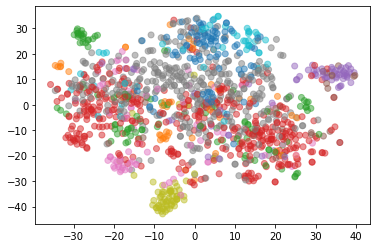

In [114]:
colors = ['tab:' + x for x in ['blue', 'orange', 'green', 'purple', 'brown', 'pink', 'red', 'olive', 'cyan', 'gray']]
col_arr = [colors[clus] for clus in y]
plt.scatter(x=emb[:,0], y=emb[:,1], c=col_arr, alpha=0.5)
plt.show()

In [ ]:
rev = rev.merge(prod[["key","name"]], how="left", on="key")

# without this, the review text goes across the entire screen & does not break lines. Here we force it to wrap
rev["text"] = rev["text"].str.wrap(30)
rev["text"] = rev["text"].apply(lambda x: x.replace('\n', '<br>'))

In [115]:
mat_data = np.concatenate((emb, np.array(y).reshape(-1,1), rev[["text", "name"]].values.reshape(-1,2)), axis=1)
df_plot = pd.DataFrame(data=mat_data, columns=["X1","X2","cluster","text", "name"])

fig = px.scatter(df_plot, x="X1", y="X2", color="cluster", opacity=0.8, hover_name = "name", hover_data={"X1":False, 
                                                                                    "X2":False, 
                                                                                    "cluster":False, 
                                                                                    "text":True})

fig.show()

### Which words are in each cluster?

In [116]:
ct_dicts = [dict(sorted(mgp.cluster_word_distribution[x].items(), key=lambda item: -item[1])) for x in range(K)]
cts = []
top_words = 10
for ct_dict in ct_dicts:
    top_keys = list(ct_dict.keys())[:top_words]
    ct =["(%s,%i)" %(key,ct_dict[key]) for key in top_keys]
    cts.append(ct)

In [117]:
pd.DataFrame(np.array(cts).T)

,0,1,2,3,4,5,6,7,8,9
0,"(bar,122)","(cookie,41)","(flavor,129)","(rum,102)","(rum,36)","(flavor,66)","(flavor,361)","(chip,187)","(bar,55)","(taste,237)"
1,"(size,62)","(flavor,27)","(taste,74)","(raisin,77)","(love,29)","(taste,63)","(taste,232)","(java,115)","(box,48)","(change,166)"
2,"(small,49)","(taste,21)","(green,56)","(flavor,69)","(flavor,25)","(coffee,61)","(love,139)","(java_chip,110)","(taste,47)","(buy,158)"
3,"(buy,39)","(dough,21)","(tea,55)","(rum_raisin,51)","(taste,17)","(back,22)","(good,116)","(coffee,104)","(buy,31)","(flavor,121)"
4,"(taste,36)","(dulce,21)","(green_tea,54)","(taste,38)","(raisin,16)","(recipe,21)","(texture,90)","(coffee_chip,58)","(costco,27)","(creamy,119)"
5,"(quality,35)","(leche,20)","(bourbon,53)","(favorite,33)","(cake,12)","(coffee_flavor,21)","(creamy,84)","(flavor,42)","(purchase,26)","(bar,103)"
6,"(almond,35)","(dulce_leche,20)","(love,30)","(buy,25)","(love_love,12)","(love,19)","(great,73)","(back,36)","(creamy,21)","(recipe,103)"
7,"(product,32)","(cookie_dough,19)","(alcohol,27)","(year,21)","(rum_raisin,10)","(change,18)","(buy,69)","(taste,29)","(buy_box,18)","(quality,85)"
8,"(box,31)","(bar,14)","(strong,24)","(change,21)","(flavour,10)","(favorite,17)","(sweet,68)","(bring,27)","(time,16)","(texture,83)"
9,"(price,30)","(chip,13)","(pecan,24)","(rum_flavor,21)","(tres,8)","(chip,15)","(eat,63)","(bring_back,23)","(small,16)","(back,80)"


### Term-frequency inverse-cluster-frequency

In [308]:
def get_important_words(docs, y, K=np.unique(y), top_words=10):
    """ Identify words that are most important to each cluster. Here I combine all documents in their respective clusters
        and then calculate a term-document matrix with tf-idf weighting; thus normalizing words that appear in many clusters.
        The top words by tf-idf score for each cluster are returned.
    
        Input:
            :docs (list of lists): documents
            :y (list): cluster labels
            :top_words (int): number of words to rank
            
        Output:
            :important_words_df (pd.DataFrame): top words for each cluster in pandas dataframe format
    """
    assert len(docs) == len(y), "Number of documents must match length of cluster label vector"

    cluster_words = ["" for i in range(K)]
    for i,label in enumerate(y):
        cluster_words[label] += " ".join(docs[i])
        
    v = TfidfVectorizer()
    dtm_c = v.fit_transform(cluster_words) # document-term matrix
    
    x = dtm_c.toarray()
    inds = x.argsort(axis=1)

    words = np.array(v.get_feature_names())
    data = []
    for i in range(K):
        data.append(words[inds[i,:-(top_words+1):-1]])
    
    important_words_df = pd.DataFrame(np.array(data).T)
    return important_words_df

In [133]:
get_important_words(docs, y, top_words=5)

,0,1,2,3,4,5,6,7,8,9
0,flavor,chip,rum,green,chip,taste,flavor,reduce,bar,taste
1,buy,java,raisin,green_tea,coffee,flavor,taste,bar,box,flavor
2,creamy,java_chip,rum_raisin,tea,coffee_chip,change,texture,box,almond,buy
3,love,coffee_chip,flavor,flavor,java,buy,good,calorie,taste,change
4,texture,coffee,taste,matcha,java_chip,creamy,love,down,small,quality


# K-means

In [121]:
kmeans = KMeans(n_clusters=10, random_state=0).fit(dtm)
y = kmeans.predict(dtm)

In [126]:
mat_data = np.concatenate((emb, np.array(y).reshape(-1,1), rev[["text", "name"]].values.reshape(-1,2)), axis=1)
df_plot = pd.DataFrame(data=mat_data, columns=["X1","X2","cluster","text", "name"])

fig = px.scatter(df_plot, x="X1", y="X2", color="cluster", opacity=0.8, hover_name = "name", hover_data={"X1":False, 
                                                                                    "X2":False, 
                                                                                    "cluster":False, 
                                                                                    "text":True})

fig.show()

In [134]:
get_important_words(docs, y, top_words=5)

,0,1,2,3,4,5,6,7,8,9
0,flavor,chip,rum,green,chip,taste,flavor,reduce,bar,taste
1,buy,java,raisin,green_tea,coffee,flavor,taste,bar,box,flavor
2,creamy,java_chip,rum_raisin,tea,coffee_chip,change,texture,box,almond,buy
3,love,coffee_chip,flavor,flavor,java,buy,good,calorie,taste,change
4,texture,coffee,taste,matcha,java_chip,creamy,love,down,small,quality


# Manual clustering

In [311]:
c1 = ['flavor', 'flavour', 'yummy', 'tasty', 'taste', 'tasting', 
      'delicious', 'sweet', 'bland', 'flavorless', 'smell', 'enjoy', 'delight'] # flavor

c2 = ['texture', 'smooth', 'rich', 'creamy', 'creaminess', 'rich', 'chunky', 
      'chunk', 'chewy', 'chew', 'gritty', 'air'] # texture

c3 = ['ingredient', 'pick', 'recipe', 'choice', 'chip', 'quality', 'formula', 'piece', 
      'check', 'bit', 'combination', 'concoction'] # ingredients

c4 = ['value', 'expensive', 'buy', 'cheap', 'pricey', 'purchase', 'size', 
      'big', 'large', 'small', 'tiny', 'balance', 'price', 'cost', 'pint',
     'money'] # value

c5 = ['change', 'previous', 'down', 'drop', 'switch', 'past', 'back', 'year', 
      'time', 'increase', 'low', 'original', 'expect', 'expectation', 'disappoint',
     'disappointed', 'disappointing', 'miss'] # change/expectations

In [261]:
# find commonly co-occurring words 
words = []
cc = c1
for doc in docs:
    if len(set(doc).intersection(set(cc))) > 1:
        words.extend(doc)

ct = Counter(words)

# inspect results
print(ct.most_common(40))

[('flavor', 480), ('taste', 355), ('chip', 288), ('cookie', 208), ('piece', 197), ('ingredient', 189), ('bit', 174), ('buy', 170), ('dough', 168), ('love', 154), ('quality', 147), ('recipe', 142), ('change', 140), ('product', 132), ('make', 126), ('good', 125), ('favorite', 108), ('texture', 106), ('find', 98), ('eat', 96), ('pint', 92), ('time', 88), ('back', 86), ('creamy', 85), ('coffee', 76), ('year', 72), ('container', 70), ('purchase', 69), ('disappointed', 69), ('swirl', 67), ('think', 64), ('great', 60), ('mint', 58), ('delicious', 57), ('sweet', 56), ('bad', 52), ('check', 52), ('add', 51), ('bar', 49), ('disappoint', 49)]


In [303]:
# how many documents contain the word taste?
len([doc for doc in docs if "taste" in doc])

2268

In [310]:
cc = c1

# finding synonyms to my hand-picked words AND which also appear often in docs
synonyms = set()
for c in cc:
    synonyms = synonyms.union(set([x.lower() for ss in wordnet.synsets(c) for x in ss.lemma_names()]))

good = []
for s in synonyms:
    l = len([doc for doc in docs if s in doc])
    if l >= 10 and s not in cc:
        good.append(s)
print(good)

['flat', 'spirit', 'sample', 'flavorless', 'love', 'sense', 'preference', 'smooth', 'look', 'feel', 'feeling', 'delight']


In [289]:
# manually clustering based on occurrences of hand-picked words
clus = []
for doc in docs:
    lens = np.zeros(5)
    d = set(doc)
    for i,c in enumerate([c1,c2,c3,c4,c5]):
        lens[i] += len(set(c).intersection(d))
        
    clus.append(np.argmax(lens))

In [316]:
# cluster size distributions
Counter(clus)

Counter({0: 3732, 3: 704, 4: 793, 1: 487, 2: 570})

In [304]:
mat_data = np.concatenate((emb, np.array(y).reshape(-1,1), rev[["text", "name"]].values.reshape(-1,2)), axis=1)
df_plot = pd.DataFrame(data=mat_data, columns=["X1","X2","cluster","text", "name"])

fig = px.scatter(df_plot, x="X1", y="X2", color="cluster", opacity=0.5, hover_name = "name", hover_data={"X1":False, 
                                                                                    "X2":False, 
                                                                                    "cluster":False, 
                                                                                    "text":True})

fig.show()

In [309]:
get_important_words(docs, y, K=5, top_words=5)

,0,1,2,3,4
0,flavor,creamy,chip,buy,flavor
1,taste,texture,cookie,pint,taste
2,good,flavor,piece,flavor,time
3,love,chunk,dough,cookie,back
4,cookie,cookie,ingredient,good,change
